# Latent space interpolation

In [48]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import os
from IPython import display
from PIL import Image
import imageio.v2 as imageio

In [49]:
def show_tensor_images(image_tensor, num_images=10, nrow=5, figsize=(12,12)):
    image_clipped = torch.clamp(image_tensor, min=-1.0, max=1.0)
    image_shifted = (image_clipped + 1) / 2
    image_grid = make_grid(image_shifted[:num_images].detach().cpu(), nrow=nrow)
    plt.figure(figsize = figsize)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis("off")
    plt.show()

In [50]:
DEVICE                  = "cuda"
CHANNELS_IMG            = 3
Z_DIM                   = 512  
IN_CHANNELS             = 512
GAMMA                   = 10

In [51]:
class ELConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(ELConv2d, self).__init__()
        self.weight = nn.Parameter(torch.zeros(out_channels, in_channels, kernel_size, kernel_size))
        self.bias = nn.Parameter(torch.zeros(out_channels))
        self.stride = stride
        self.padding = padding
        self.fan_in = in_channels * kernel_size * kernel_size
        self.scale = (2 / self.fan_in) ** (0.5)

        nn.init.normal_(self.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return F.conv2d(input=x,
                        weight=self.weight * self.scale,
                        bias=self.bias,
                        stride=self.stride,
                        padding=self.padding)

class ELConvTranspose2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=1, padding=0):
        super(ELConvTranspose2d, self).__init__()
        self.weight = nn.Parameter(torch.zeros(in_channels, out_channels, kernel_size, kernel_size))
        self.bias = nn.Parameter(torch.zeros(out_channels))
        self.stride = stride
        self.padding = padding
        self.fan_in = in_channels
        self.scale = (2 / self.fan_in) ** (0.5)

        nn.init.normal_(self.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return F.conv_transpose2d(input=x,
                                  weight=self.weight * self.scale,
                                  bias=self.bias,
                                  stride=self.stride,
                                  padding=self.padding)
        
class ELLinear(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ELLinear, self).__init__()
        self.weight = nn.Parameter(torch.zeros(out_channels, in_channels))
        self.bias = nn.Parameter(torch.zeros(out_channels))
        self.fan_in = in_channels
        self.scale = (2 / self.fan_in) ** (0.5)

    def forward(self, x):
        return F.linear(input=x,
                        weight=self.weight * self.scale,
                        bias=self.bias)
        
class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

class MiniBatchSTD(nn.Module):
    def __init__(self):
        super(MiniBatchSTD, self).__init__()
        self.alpha = 1e-8

    def forward(self, x):
        batch_size, _, height, width = x.shape
        y = x - x.mean(dim=0, keepdim=True)
        y = torch.sqrt(y.pow(2).mean(dim=0, keepdim=False) + self.alpha)
        y = y.mean()
        y = y.repeat(batch_size, 1, height, width)
        y = torch.cat([x, y], 1)
        return y

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_pixelnorm=True):
        super(ConvBlock, self).__init__()
        self.use_pn = use_pixelnorm
        self.conv1 = ELConv2d(in_channels, out_channels)
        self.conv2 = ELConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        return x

In [52]:
class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()

        self.initial_block = nn.Sequential(
            PixelNorm(),
            ELLinear(z_dim, in_channels * 4 * 4),
            nn.Unflatten(1, (in_channels, 4, 4)),
            nn.LeakyReLU(0.2),
            PixelNorm(),
            ELConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )  # 4
        
        self.prog_blocks = nn.ModuleList([
            ConvBlock(in_channels, in_channels),              # 8
            ConvBlock(in_channels, in_channels),              # 16
            ConvBlock(in_channels, in_channels),              # 32
            ConvBlock(in_channels, in_channels // 2),         # 64
            ConvBlock(in_channels // 2, in_channels // 4),    # 128
        ])

        self.to_rgb_layers = nn.ModuleList([
            ELConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0),        # 4
            ELConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0),        # 8
            ELConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0),        # 16
            ELConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0),        # 32
            ELConv2d(in_channels // 2, img_channels, kernel_size=1, stride=1, padding=0),   # 64
            ELConv2d(in_channels // 4, img_channels, kernel_size=1, stride=1, padding=0),   # 128
        ])

    def forward(self, x, alpha, steps):
        assert alpha >= 0 and alpha <= 1, "Value of alpha out of range"

        out = self.initial_block(x)

        if steps == 0:
            return self.to_rgb_layers[0](out)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="nearest")
            out = self.prog_blocks[step](upscaled)

        if alpha < 1:
            final_upscaled = self.to_rgb_layers[steps - 1](upscaled)
            final_out = self.to_rgb_layers[steps](out)
            return alpha * final_out + (1 - alpha) * final_upscaled
        else:
            final_out = self.to_rgb_layers[steps](out)
            return final_out

Load pretrained weights saved in my google drive

In [54]:
gen_ema = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
loaded_state = torch.load('/content/drive/MyDrive/AnimeFaces_v3/AnimeFaces_128px.pt')
gen_ema.load_state_dict(loaded_state["gen_ema"])
gen_ema.eval();

Load selected latent vectors

In [55]:
selected = torch.load('/content/drive/MyDrive/AnimeFaces_v3/Selected noises 128px.pt')

Images generated from selected latent vectors


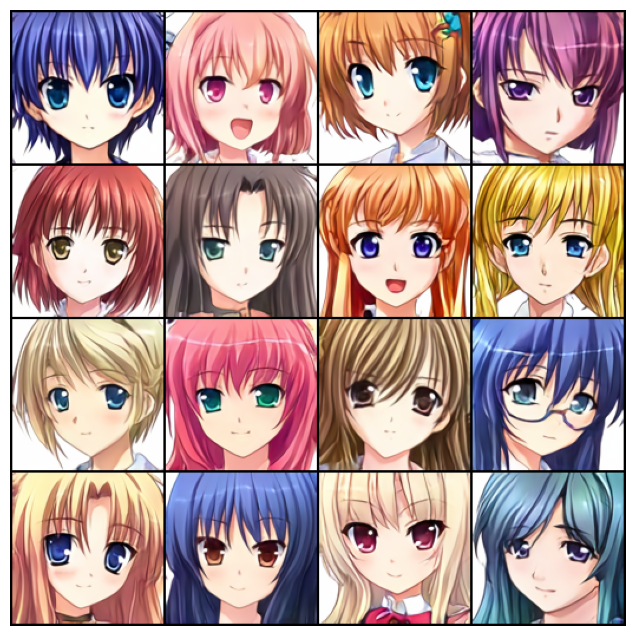

In [56]:
print("Images generated from selected latent vectors")
with torch.no_grad():
    img = gen_ema(selected.to('cuda'), 1, 5)
    img = torch.clamp(img, min=-1.0, max=1.0)
    show_tensor_images(img, num_images=16, nrow=4, figsize=(8,8))

Select three latent vectors for interpolation

In [57]:
noise1 = selected[3,:].view(1, Z_DIM)
noise2 = selected[8,:].view(1, Z_DIM)
noise3 = selected[12,:].view(1, Z_DIM)

In [58]:
with torch.no_grad():
    g1 = ((torch.clamp(gen_ema(noise1, 1.0, 5), min=-1.0, max=1.0)+1)/2).squeeze().permute(1,2,0).detach().to('cpu')
    g2 = ((torch.clamp(gen_ema(noise2, 1.0, 5), min=-1.0, max=1.0)+1)/2).squeeze().permute(1,2,0).detach().to('cpu')
    g3 = ((torch.clamp(gen_ema(noise3, 1.0, 5), min=-1.0, max=1.0)+1)/2).squeeze().permute(1,2,0).detach().to('cpu')

Images to be used for interpolation


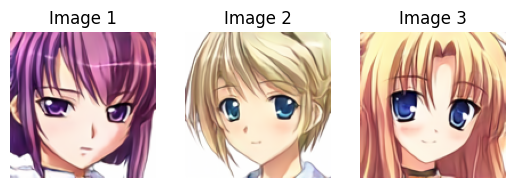

In [59]:
print("Images to be used for interpolation")
fig, ax = plt.subplots(1,3)
ax[0].imshow(g1)
ax[0].title.set_text('Image 1')
ax[0].axis('off')
ax[1].imshow(g2)
ax[1].title.set_text('Image 2')
ax[1].axis('off')
ax[2].imshow(g3)
ax[2].title.set_text('Image 3')
ax[2].axis('off')
plt.show()

In [60]:
weights = torch.linspace(0, 1, steps=11).to(DEVICE)

Use spherical linear interpolation (slerp) for interpolation

In [61]:
def slerp(start, end, weight):
    start_norm = start/torch.linalg.norm(start)
    end_norm = end/torch.linalg.norm(end)
    omega = torch.acos(torch.sum((start_norm*end_norm)))
    result = (torch.sin((1.0-weight)*omega)/torch.sin(omega)) * start + (torch.sin(weight*omega)/torch.sin(omega)) * end
    return result

In [62]:
imgs_1 = []
imgs_2 = []
imgs_3 = []

In [63]:
for i in range(11):
    interpolated = slerp(noise1, noise2, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_1.append(img)

In [64]:
for i in range(11):
    interpolated = slerp(noise2, noise3, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_2.append(img)

In [65]:
for i in range(11):
    interpolated = slerp(noise3, noise1, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_3.append(img)

In [66]:
tensor_imgs_1 = torch.cat([img for img in imgs_1], dim=0)

In [67]:
tensor_imgs_2 = torch.cat([img for img in imgs_2], dim=0)

In [68]:
tensor_imgs_3 = torch.cat([img for img in imgs_3], dim=0)

Images generated by interpolated latent vectors

Left to right: Interpolated latent vectors = (1-x) * latent vector 1 + x * latent vector 2, x = 0, 0.1, 0.2, 0.3,..., 1

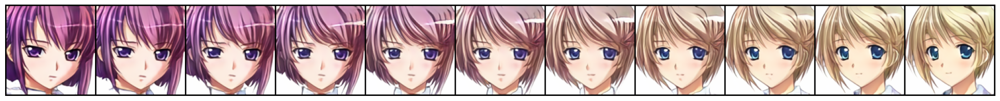

In [69]:
show_tensor_images(tensor_imgs_1, num_images=11, nrow=11, figsize=(25,25))

Left to right: Interpolated latent vectors = (1-x) * latent vector 2 + x * latent vector 3, x = 0, 0.1, 0.2, 0.3,..., 1

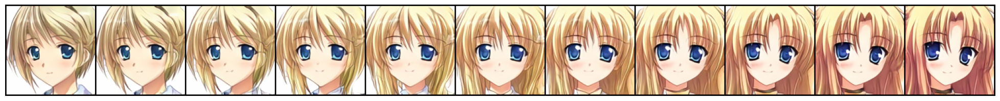

In [70]:
show_tensor_images(tensor_imgs_2, num_images=11, nrow=11, figsize=(25,25))

Left to right: Interpolated latent vectors = (1-x) * latent vector 3 + x * latent vector 1, x = 0, 0.1, 0.2, 0.3,..., 1

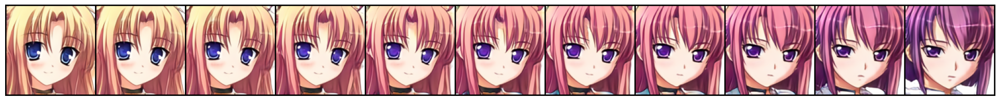

In [71]:
show_tensor_images(tensor_imgs_3, num_images=11, nrow=11, figsize=(25,25))

In [72]:
img_1_to_2 = torch.cat([(tensor_imgs_1[i,:,:,:]+1)/2 for i in range(len(tensor_imgs_1))], dim=-1)
img_2_to_3 = torch.cat([(tensor_imgs_2[i,:,:,:]+1)/2 for i in range(len(tensor_imgs_2))], dim=-1)
img_3_to_1 = torch.cat([(tensor_imgs_3[i,:,:,:]+1)/2 for i in range(len(tensor_imgs_3))], dim=-1)

Save interpolated images

In [73]:
save_image(img_1_to_2, 'Interpolation1.png')
save_image(img_2_to_3, 'Interpolation2.png')
save_image(img_3_to_1, 'Interpolation3.png')

Use a smaller step to make .gif file

In [74]:
imgs_1 = []
imgs_2 = []
imgs_3 = []

In [75]:
weights = torch.linspace(0, 1, steps=101).to(DEVICE)

In [76]:
if not os.path.exists('Interpolation'):
    os.makedirs('Interpolation')

Interpolated latent vectors = (1-x) * latent vector 1 + x* latent vector 2, x = 0, 0.01, 0.02, 0.03,..., 1

In [77]:
for i in range(101):
    interpolated = slerp(noise1, noise2, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_1.append(img)
        if i < 10:
            name = '1_' + '00' + str(i)
        elif i < 100:
            name = '1_' + '0' + str(i)
        else:
            name = '1_' + str(i)
        save_image(img*0.5+0.5, f"Interpolation/img_{name}.png")

Interpolated latent vectors = (1-x) * latent vector 2 + x* latent vector 3, x = 0, 0.01, 0.02, 0.03,..., 1

In [78]:
for i in range(101):
    interpolated = slerp(noise2, noise3, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_2.append(img)
        if i < 10:
            name = '2_' + '00' + str(i)
        elif i < 100:
            name = '2_' + '0' + str(i)
        else:
            name = '2_' + str(i)
        save_image(img*0.5+0.5, f"Interpolation/img_{name}.png")

Interpolated latent vectors = (1-x) * latent vector 3 + x* latent vector 1, x = 0, 0.01, 0.02, 0.03,..., 1

In [79]:
for i in range(101):
    interpolated = slerp(noise3, noise1, weights[i]).to(DEVICE)
    with torch.no_grad():
        img = gen_ema(interpolated, 1.0, 5)
        img = torch.clamp(img, min=-1.0, max=1.0)
        imgs_3.append(img)
        if i < 10:
            name = '3_' + '00' + str(i)
        elif i < 100:
            name = '3_' + '0' + str(i)
        else:
            name = '3_' + str(i)
        save_image(img*0.5+0.5, f"Interpolation/img_{name}.png")

In [81]:
tensor_imgs_1 = torch.cat([x for x in imgs_1], dim=0)
tensor_imgs_2 = torch.cat([x for x in imgs_2], dim=0)
tensor_imgs_3 = torch.cat([x for x in imgs_3], dim=0)

Create the .gif file about the interpolation

In [83]:
img_names = sorted(os.listdir('Interpolation'))

In [84]:
images = []

In [85]:
for image_name in img_names:
    if image_name.startswith('img_1'):
        images.append(imageio.imread(os.path.join('Interpolation', image_name)))

In [86]:
for _ in range(30):
    images.append(imageio.imread(os.path.join('Interpolation', 'img_1_100.png')))

In [87]:
for image_name in img_names:
    if image_name.startswith('img_2'):
        images.append(imageio.imread(os.path.join('Interpolation', image_name)))

In [88]:
for _ in range(30):
    images.append(imageio.imread(os.path.join('Interpolation', 'img_2_100.png')))

In [89]:
for image_name in img_names:
    if image_name.startswith('img_3'):
        images.append(imageio.imread(os.path.join('Interpolation', image_name)))

In [90]:
for _ in range(30):
    images.append(imageio.imread(os.path.join('Interpolation', 'img_3_100.png')))

Save the .gif file

In [91]:
imageio.mimsave('Interpolation.gif', images, fps=30)

Show the .gif file

Interpolation


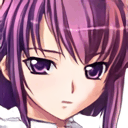

In [92]:
from IPython import display
print("Interpolation")
display.Image(open('/content/Interpolation.gif', 'rb').read())